In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import LabelEncoder



In [2]:
path = 'C:/Users/USA/Downloads/archive (3)/'
file_name = "diabetes_prediction_dataset"

#Leo el archivo con pandas
df3 = pd.read_csv(path + file_name + '.csv')
fil3,col3=df3.shape
fil3,col3

(100000, 9)

In [3]:
#Encabezado de mis datos
df3.head(5)


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [4]:
from sklearn.metrics import matthews_corrcoef

In [5]:
X=df3["diabetes"]
y1=df3["hypertension"]
y2=df3["heart_disease"]


# Encoding

In [6]:

def encode(data):
    encoder = data.copy()
    coder=LabelEncoder()
    encoder['gender']=coder.fit_transform(encoder['gender'])
    encoder['smoking_history']=coder.fit_transform(encoder['smoking_history'])
    return encoder
encode(df3)


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,4,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0,80.0,0,0,0,27.32,6.2,90,0
99996,0,2.0,0,0,0,17.37,6.5,100,0
99997,1,66.0,0,0,3,27.83,5.7,155,0
99998,0,24.0,0,0,4,35.42,4.0,100,0


In [7]:
df3=encode(df3)


# Split

In [46]:
X=df3.drop('diabetes',axis=1)
y=df3['diabetes']

In [38]:
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y,random_state=1,test_size=0.20)

#Usaré SMOTE para balancear el dataset 
from imblearn.over_sampling import SMOTE
oversampler = SMOTE()
x_over, y_over = oversampler.fit_resample(x_train, y_train)




print("X TRAIN SHAPE: ",x_over.shape)
print("X TEST SHAPE: ",x_test.shape)
print("Y TRAIN SHAPE: ",y_over.shape)
print("Y TEST SHAPE: ",y_test.shape)


scale=StandardScaler()
x_scaled=scale.fit_transform(x_over)
xtest_scaled=scale.fit_transform(x_test)

X TRAIN SHAPE:  (146402, 8)
X TEST SHAPE:  (20000, 8)
Y TRAIN SHAPE:  (146402,)
Y TEST SHAPE:  (20000,)


# Predicciones 


In [39]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics 
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression().fit(x_scaled,y_over)
knn = KNeighborsClassifier().fit(x_scaled,y_over)
arbol = DecisionTreeClassifier(random_state=42).fit(x_scaled,y_over)
rand=RandomForestClassifier().fit(x_scaled,y_over)


#Ahora las predicciones 
lrpre=lr.predict(xtest_scaled)
knnpre=knn.predict(xtest_scaled)
arbolpre=arbol.predict(xtest_scaled)
randpre=rand.predict(xtest_scaled)


In [40]:
#Ahora algunas métricas 
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score


b=accuracy_score(y_test,knnpre)
c=accuracy_score(y_test,arbolpre)
d=accuracy_score(y_test,randpre)

print("Usando Accuracy Score las métricas fueron de: ")
print("-KNN: {:.4f}".format(b))
print("-Tree Decision: {:.4f}".format(c))
print("-Random Forest: {:.4f}".format(d))

Usando Accuracy Score las métricas fueron de: 
-KNN: 0.6935
-Tree Decision: 0.4725
-Random Forest: 0.5357


               Resume for Logistic regression metrics
              precision    recall  f1-score   support

           0      1.000     0.544     0.704     18299
           1      0.169     0.998     0.289      1701

    accuracy                          0.582     20000
   macro avg      0.584     0.771     0.497     20000
weighted avg      0.929     0.582     0.669     20000



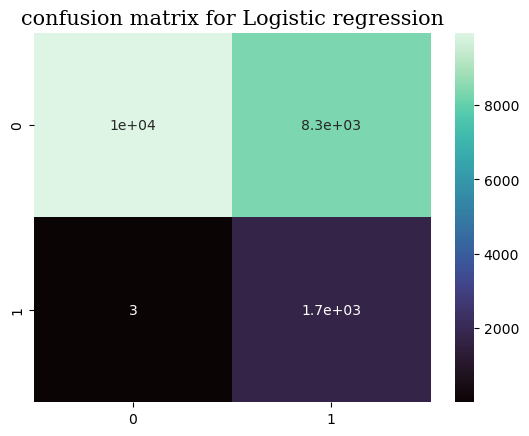

In [41]:
from sklearn.metrics import confusion_matrix,classification_report

cn=confusion_matrix(y_test,lrpre)
sns.heatmap(cn,annot=True,cmap='mako')
plt.title("confusion matrix for Logistic regression",loc="center",fontdict={'family': 'serif'},size=15)

print("               Resume for Logistic regression metrics")
print(metrics.classification_report(y_test, lrpre, digits=3))

               Resume for KNN metrics
              precision    recall  f1-score   support

           0      0.993     0.670     0.800     18299
           1      0.211     0.950     0.345      1701

    accuracy                          0.694     20000
   macro avg      0.602     0.810     0.573     20000
weighted avg      0.927     0.694     0.761     20000



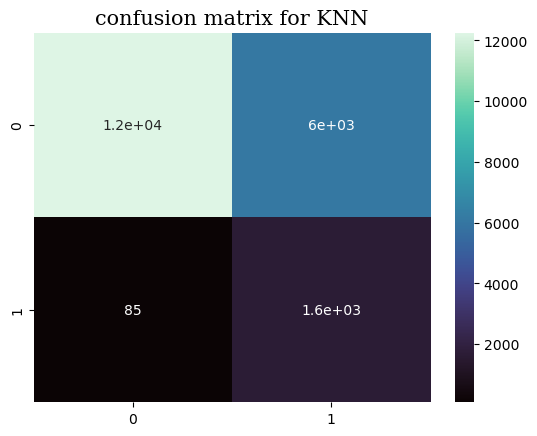

In [42]:
cn1=confusion_matrix(y_test,knnpre)
sns.heatmap(cn1,annot=True,cmap='mako')
plt.title("confusion matrix for KNN",loc="center",fontdict={'family': 'serif'},size=15)
print("               Resume for KNN metrics")
print(metrics.classification_report(y_test, knnpre, digits=3))

               Resumen de Tree decision
              precision    recall  f1-score   support

           0      1.000     0.424     0.595     18299
           1      0.139     0.998     0.244      1701

    accuracy                          0.472     20000
   macro avg      0.569     0.711     0.419     20000
weighted avg      0.926     0.472     0.565     20000



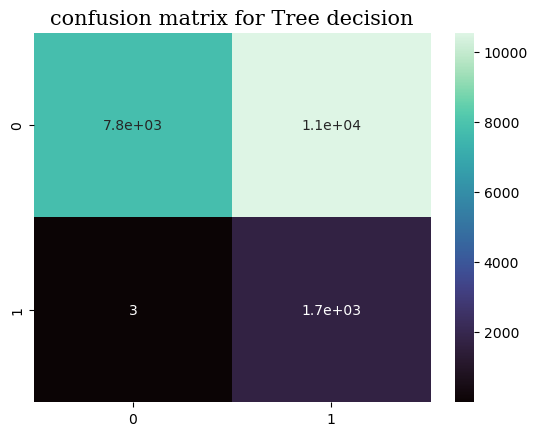

In [43]:
cn2=confusion_matrix(y_test,arbolpre)
sns.heatmap(cn2,annot=True,cmap='mako')
plt.title("confusion matrix for Tree decision",loc="center",fontdict={'family': 'serif'},size=15)
print("               Resumen de Tree decision")
print(metrics.classification_report(y_test, arbolpre, digits=3))

               Resumen de Tree decision
              precision    recall  f1-score   support

           0      0.997     0.494     0.661     18299
           1      0.153     0.985     0.265      1701

    accuracy                          0.536     20000
   macro avg      0.575     0.740     0.463     20000
weighted avg      0.925     0.536     0.627     20000



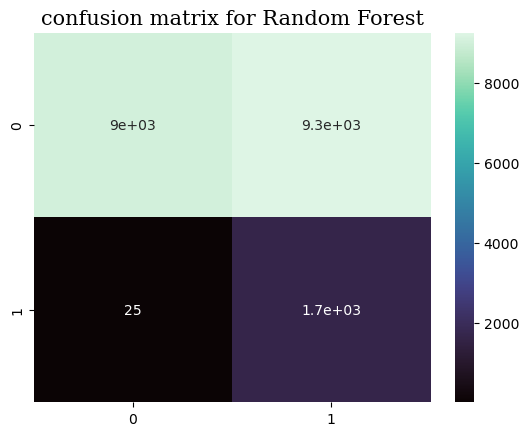

In [49]:
cn3=confusion_matrix(y_test,randpre)
sns.heatmap(cn3,annot=True,cmap='mako')
plt.title("confusion matrix for Random Forest",loc="center",fontdict={'family': 'serif'},size=15)
print("               Resumen de Tree decision")
print(metrics.classification_report(y_test, randpre, digits=3))

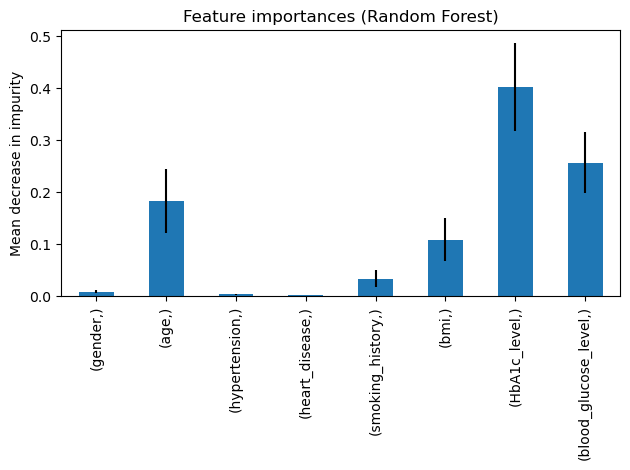

In [45]:
feature_names = [x_test.columns.values]
importances = rand.feature_importances_
std = np.std([tree.feature_importances_ for tree in rand.estimators_], axis=0)
import pandas as pd

forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances (Random Forest)")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()


In [54]:
import plotly.express as px
from sklearn.decomposition import PCA


pca = PCA(n_components=5)
components = pca.fit_transform(X)


total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df3['diabetes'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()